# Vehicles Detection from traffic using Yolo & Azure ML

<img src="https://github.com/retkowsky/CustomVision_Datasets/blob/master/trafficyolo.jpg?raw=true" width = 800>

## 1. Settings

In [1]:
#!pip install imageai
#!pip install --upgrade tensorflow
#!pip install moviepy
#!pip install pytube
#!pip install xlwt

In [136]:
import os
import cv2
import matplotlib.pyplot as plt
import os.path
import os
import urllib
import datetime
import pandas as pd
import moviepy
from moviepy.editor import *
from imageai.Detection import VideoObjectDetection
import xlwt
from azureml.core.experiment import Experiment
from azureml.core.workspace import Workspace
import time
import pytube
from pytube.streams import Stream
import seaborn as sns
import random

In [3]:
import sys
sys.version

'3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 19:07:31) \n[GCC 7.3.0]'

In [4]:
print(datetime.datetime.now())

2022-01-18 09:45:41.294950


In [5]:
os.getcwd()

'/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection'

In [6]:
import platform,socket,re,uuid,json,psutil,logging

def getSystemInfo():
    try:
        info={}
        info['Platform']=platform.system()
        info['Platform-release']=platform.release()
        info['Platform-version']=platform.version()
        info['Architecture']=platform.machine()
        info['Hostname']=socket.gethostname()
        info['IP-address']=socket.gethostbyname(socket.gethostname())
        info['MAC-address']=':'.join(re.findall('..', '%012x' % uuid.getnode()))
        info['Processeur']=platform.processor()
        info['RAM']=str(round(psutil.virtual_memory().total / (1024.0 **3)))+" Go"
        return json.dumps(info)
    except Exception as e:
        logging.exception(e)

json.loads(getSystemInfo())

{'Platform': 'Linux',
 'Platform-release': '5.4.0-1063-azure',
 'Platform-version': '#66~18.04.1-Ubuntu SMP Thu Oct 21 09:59:28 UTC 2021',
 'Architecture': 'x86_64',
 'Hostname': 'seretkow5',
 'IP-address': '127.0.0.1',
 'MAC-address': '45:84:1f:45:27:2b',
 'Processeur': 'x86_64',
 'RAM': '220 Go'}

In [7]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)

if gpu_info.find('failed') >= 0:
    print('Select an Azure ML GPU compute instance ')

else:
    print(gpu_info)

Tue Jan 18 09:45:41 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           On   | 00000001:00:00.0 Off |                    0 |
| N/A   38C    P8    25W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla K80           On   | 00000002:00:00.0 Off |                    0 |
| N/A   

In [8]:
ws = Workspace.from_config()
print('Current Azure ML Workspace: ' + ws.name, 
      'Region: ' + ws.location, 
      'Ressource Group: ' + ws.resource_group, sep='\n')

Current Azure ML Workspace: AMLworkshop
Region: westeurope
Ressource Group: AMLworkshop-rg


In [9]:
from azureml.core import experiment
experiment = Experiment(workspace=ws, name="Vehicles_Detection")

In [10]:
experiment

Name,Workspace,Report Page,Docs Page
Vehicles_Detection,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


## 2. Downloading yolo.h5 file

In [11]:
if os.path.isfile('yolo/yolo.h5'):
    print("yolo.h5 file is available.")

else:
    print("yolo.h5 file not there => Let's download it...\n")
    os.mkdir('yolo')
    download_url = 'https://github.com/OlafenwaMoses/ImageAI/releases/download/1.0/yolo.h5'
    yolo_file = 'yolo/yolo.h5'
    t1 = datetime.datetime.now()
    print(t1, "Downloading yolo file...")
    urllib.request.urlretrieve(download_url, filename=yolo_file)
    t2 = datetime.datetime.now()
    print("Done in:", t2 - t1)

yolo.h5 file not there => Let's download it...

2022-01-18 09:45:43.836827 Downloading yolo file...
Done in: 0:00:30.381569


In [12]:
!ls yolo/*.* -lh

-rwxrwxrwx 1 root root 238M Jan 18 09:46 yolo/yolo.h5


In [13]:
from imageai import Detection

modelpath = "yolo/yolo.h5" # Yolo file location

yolo = Detection.ObjectDetection()
yolo.setModelTypeAsYOLOv3()
yolo.setModelPath(modelpath)
yolo.loadModel()

There are 80 possible objects that you can detect with the
ObjectDetection class, and they are as seen below.

    person,   bicycle,   car,   motorcycle,   airplane,
    bus,   train,   truck,   boat,   traffic light,   fire hydrant,   stop_sign,
    parking meter,   bench,   bird,   cat,   dog,   horse,   sheep,   cow,   elephant,   bear,   zebra,
    giraffe,   backpack,   umbrella,   handbag,   tie,   suitcase,   frisbee,   skis,   snowboard,
    sports ball,   kite,   baseball bat,   baseball glove,   skateboard,   surfboard,   tennis racket,
    bottle,   wine glass,   cup,   fork,   knife,   spoon,   bowl,   banana,   apple,   sandwich,   orange,
    broccoli,   carrot,   hot dog,   pizza,   donot,   cake,   chair,   couch,   potted plant,   bed,
    dining table,   toilet,   tv,   laptop,   mouse,   remote,   keyboard,   cell phone,   microwave,
    oven,   toaster,   sink,   refrigerator,   book,   clock,   vase,   scissors,   teddy bear,   hair dryer,
    toothbrush.

## 3. Analyzing an image

In [155]:
import urllib.request

file_url = 'https://github.com/retkowsky/CustomVision_Datasets/blob/master/paristraffic.jpg?raw=true'
image_file = 'Images/paristraffic.jpg'
print("Donwloading image file:", image_file)
urllib.request.urlretrieve(file_url, filename=image_file)
print("Done.")

Donwloading image file: Images/paristraffic.jpg
Done.


### Initial image

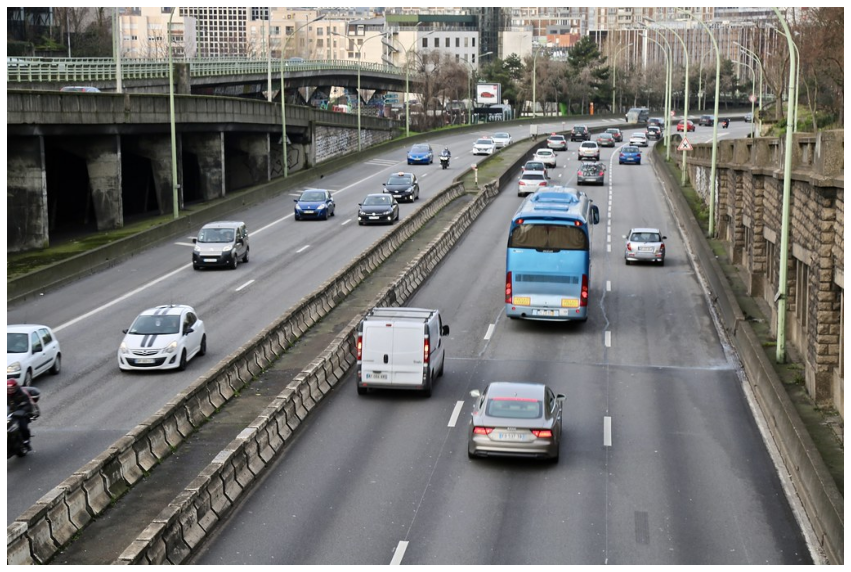

In [156]:
img = cv2.imread(image_file)

plt.figure(figsize=(15,15)) 
plt.axis('off')
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)

In [157]:
print(img.shape)

(683, 1024, 3)


In [168]:
img, preds = yolo.detectObjectsFromImage(input_image = image_file, 
                                         custom_objects = None, 
                                         input_type="file",
                                         output_type="array",
                                         minimum_percentage_probability = 50,
                                         display_percentage_probability = True,
                                         display_object_name = True)

### Results

In [170]:
preds

[{'name': 'bus',
  'percentage_probability': 97.72170186042786,
  'box_points': [607, 260, 721, 414]},
 {'name': 'car',
  'percentage_probability': 99.86085295677185,
  'box_points': [133, 365, 248, 455]},
 {'name': 'truck',
  'percentage_probability': 88.93810510635376,
  'box_points': [427, 384, 539, 497]},
 {'name': 'car',
  'percentage_probability': 95.23489475250244,
  'box_points': [559, 476, 682, 579]},
 {'name': 'car',
  'percentage_probability': 63.502418994903564,
  'box_points': [689, 158, 712, 176]},
 {'name': 'car',
  'percentage_probability': 78.32612991333008,
  'box_points': [724, 165, 751, 183]},
 {'name': 'car',
  'percentage_probability': 97.8578507900238,
  'box_points': [488, 175, 523, 204]},
 {'name': 'car',
  'percentage_probability': 56.31122589111328,
  'box_points': [528, 179, 543, 203]},
 {'name': 'car',
  'percentage_probability': 93.41005682945251,
  'box_points': [568, 169, 599, 192]},
 {'name': 'car',
  'percentage_probability': 56.92054629325867,
  'box_

In [171]:
print("\033[1;31;34mTotal of detected attributes =", len(preds), '\n')
print("Details:")

i = 1
nb_cars = nb_trucks = nb_motos = nb_persons = nb_bus = nb_vehicles = 0

for key in preds:
    #print(i, key)
    print(i, '\t', str.upper(key['name']), ' ', round(key['percentage_probability']/100, 5), 
          ' BBox:', key['box_points'])
    if key['name'] == 'car':
        nb_cars +=1
    if key['name'] == 'truck':
        nb_trucks +=1
    if key['name'] == 'motorcycle':
        nb_motos +=1
    if key['name'] == 'person':
        nb_persons +=1
    if key['name'] == 'bus':
        nb_bus +=1
    i +=1

nb_vehicles = nb_cars + nb_motos + nb_trucks + nb_bus

print("\nNumber of vehicles =", nb_vehicles)
print("- Number of cars =", nb_cars)
print("- Number of trucks =", nb_trucks)
print("- Number of buses =", nb_bus)
print("- Number of motorcycles =", nb_motos)
print("\nNumber of persons =", nb_persons)

Total of detected attributes = 24 

Details:
1 	 BUS   0.97722  BBox: [607, 260, 721, 414]
2 	 CAR   0.99861  BBox: [133, 365, 248, 455]
3 	 TRUCK   0.88938  BBox: [427, 384, 539, 497]
4 	 CAR   0.95235  BBox: [559, 476, 682, 579]
5 	 CAR   0.63502  BBox: [689, 158, 712, 176]
6 	 CAR   0.78326  BBox: [724, 165, 751, 183]
7 	 CAR   0.97858  BBox: [488, 175, 523, 204]
8 	 CAR   0.56311  BBox: [528, 179, 543, 203]
9 	 CAR   0.9341  BBox: [568, 169, 599, 192]
10 	 CAR   0.56921  BBox: [649, 177, 680, 197]
11 	 CAR   0.8328  BBox: [657, 170, 688, 191]
12 	 CAR   0.90658  BBox: [698, 179, 726, 201]
13 	 CAR   0.9525  BBox: [747, 183, 780, 206]
14 	 CAR   0.68494  BBox: [640, 192, 671, 213]
15 	 CAR   0.97063  BBox: [458, 211, 508, 247]
16 	 CAR   0.9445  BBox: [622, 210, 663, 239]
17 	 CAR   0.79531  BBox: [692, 206, 732, 231]
18 	 CAR   0.99737  BBox: [349, 229, 404, 269]
19 	 CAR   0.99471  BBox: [426, 235, 481, 278]
20 	 CAR   0.64069  BBox: [628, 234, 722, 284]
21 	 CAR   0.98534  BBox: 

True

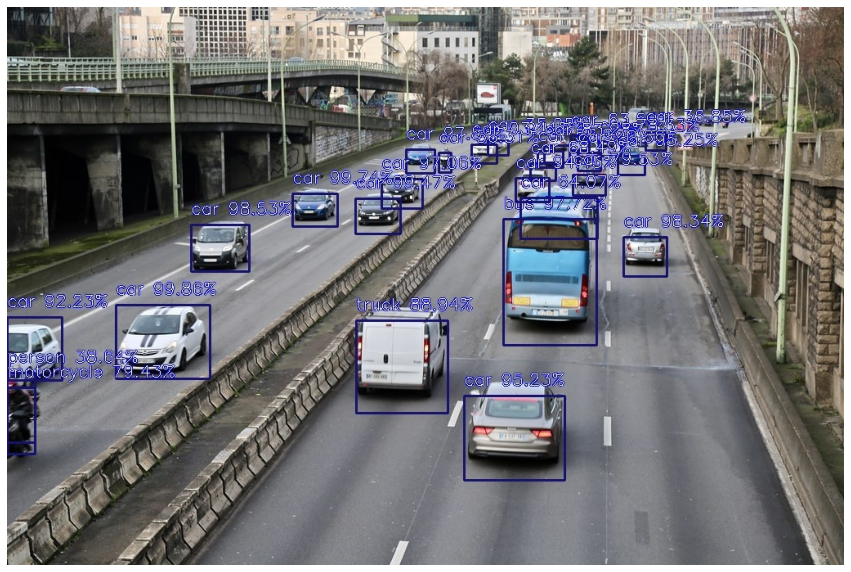

In [172]:
processedimage_file = "Images/result.jpg"
img = cv2.imread(processedimage_file)

plt.figure(figsize=(15,15)) 
plt.axis('off')
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
cv2.imwrite(processedimage_file, img)

## 4. Video analytics

Video is available here: https://www.youtube.com/watch?v=wqctLW0Hb_0&t=1s

In [25]:
YOUTUBELINK = "https://www.youtube.com/watch?v=wqctLW0Hb_0&t=1s"

### Let's download this video

In [26]:
def DownloadYTVideo(link):
    t1 = datetime.datetime.now()
    youTube = pytube.YouTube(link)
    print("Downloading YouTube video...")
    stream = youTube.streams.get_highest_resolution()
    stream.download()
    t2 = datetime.datetime.now()
    print("Done in:", t2 - t1)

In [27]:
os.mkdir('videos')
os.chdir('videos')
DownloadYTVideo(YOUTUBELINK)
os.chdir('..')

Done in: 0:00:08.084431


In [28]:
!ls videos/*.* -lh

-rwxrwxrwx 1 root root 183M Jan 18 09:48 'videos/Road traffic video for object recognition.mp4'


In [29]:
VIDEOFILE = 'videos/Road traffic video for object recognition.mp4'

In [30]:
MYVIDEOFILE = VideoFileClip(VIDEOFILE)

fps = MYVIDEOFILE.fps
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h
duration = MYVIDEOFILE.duration

nbframes = int(fps * duration)
duration_min = round(duration / 60, 2)

print("\033[1;31;34mVideo File :", VIDEOFILE)
print("\nWidth:", w, "Height:", h)
print("FPS =", fps)
print("Duration in minutes :", duration_min)
print("Number of frames =", nbframes)

Video File : videos/Road traffic video for object recognition.mp4

Width: 1280 Height: 720
FPS = 25.0
Duration in minutes : 34.13
Number of frames = 51201


### Let's create a 5 sec video clip from the initial video

In [31]:
MYCLIP = MYVIDEOFILE.subclip(0, 5)

clipduration = MYCLIP.duration 
print("Clip duration =", clipduration, 'seconds\n')
MYCLIP.ipython_display()

Clip duration = 5 seconds

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [32]:
os.mkdir('output')

In [33]:
# Saving the video clip
MYCLIPNAME = "output/myclip.mp4"
MYCLIP.write_videofile(MYCLIPNAME)

Moviepy - Building video output/myclip.mp4.
MoviePy - Writing audio in myclipTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output/myclip.mp4



Moviepy - Done !
Moviepy - video ready output/myclip.mp4


In [34]:
!ls output/myclip.mp4 -lh

-rwxrwxrwx 1 root root 665K Jan 18 09:48 output/myclip.mp4


In [35]:
MYVIDEOFILE = VideoFileClip(MYCLIPNAME)

fps = MYVIDEOFILE.fps
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h
duration = MYVIDEOFILE.duration

nbframes = int(fps * duration)

print("\033[1;31;34mVideo File :", MYCLIPNAME)
print("\nWidth:", w, "Height:", h)
print("FPS =", fps)
print("Duration in sec :", duration)
print("Number of frames =", nbframes)

Video File : output/myclip.mp4

Width: 1280 Height: 720
FPS = 25.0
Duration in sec : 5.04
Number of frames = 126


### Let's analyse the sample video

In [36]:
print(MYCLIPNAME)
MYCLIPRESULTS = "output/myclip_output"

output/myclip.mp4


In [37]:
t1 = datetime.datetime.now()
execution_path = os.getcwd()

print(t1, "Analysing video...\n")

detector = VideoObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath( os.path.join(execution_path , "yolo/yolo.h5"))
detector.loadModel()

video_path = detector.detectObjectsFromVideo(input_file_path=os.path.join(execution_path, MYCLIPNAME),
                            output_file_path = os.path.join(execution_path, MYCLIPRESULTS),
                            frames_per_second = 25, 
                            log_progress = True)

t2 = datetime.datetime.now()
print("\nDone in:", t2 - t1)

2022-01-18 09:48:32.569433 Analysing video...

Processing Frame :  1
Processing Frame :  2
Processing Frame :  3
Processing Frame :  4
Processing Frame :  5
Processing Frame :  6
Processing Frame :  7
Processing Frame :  8
Processing Frame :  9
Processing Frame :  10
Processing Frame :  11
Processing Frame :  12
Processing Frame :  13
Processing Frame :  14
Processing Frame :  15
Processing Frame :  16
Processing Frame :  17
Processing Frame :  18
Processing Frame :  19
Processing Frame :  20
Processing Frame :  21
Processing Frame :  22
Processing Frame :  23
Processing Frame :  24
Processing Frame :  25
Processing Frame :  26
Processing Frame :  27
Processing Frame :  28
Processing Frame :  29
Processing Frame :  30
Processing Frame :  31
Processing Frame :  32
Processing Frame :  33
Processing Frame :  34
Processing Frame :  35
Processing Frame :  36
Processing Frame :  37
Processing Frame :  38
Processing Frame :  39
Processing Frame :  40
Processing Frame :  41
Processing Frame : 

### Results

In [38]:
!ls output/myclip_output.avi

output/myclip_output.avi


In [39]:
# Viewing the video clip results
result = VideoFileClip('output/myclip_output.avi')
result.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## 5. Analysing a video in real time

Let's use now the same video but with a different time length. We have an initial long video (34 min). So we will create first a clip video in order to reducethe time. We will not analyse all the frames (we have a FPS = 25). We can decide to extract only some frames. We will count the vehicules in total and for each lanes (left lanes & right lanes).

In [40]:
from imageai import Detection
modelpath = "yolo/yolo.h5"

yolo = Detection.ObjectDetection()
yolo.setModelTypeAsYOLOv3()
yolo.setModelPath(modelpath)
yolo.loadModel()

In [52]:
# Directories to create if needed
dir1 = 'results'
dir2 = 'results/captures'

In [53]:
def createdir(dirname):
    import os.path
    from os import path
    if path.os.path.isdir(dirname) :
        print("Directory:", dirname, "exists!")
    else:
        print("Creating directory:", dirname)
        os.mkdir(dirname)
        print("Done!")

In [54]:
createdir(dir1)
createdir(dir2)

Creating directory: results
Done!
Creating directory: results/captures
Done!


In [57]:
# videofile or a RTSP link for the Real Time Streaming protocol (initial video) from the YouTube link
WEBCAM = "videos/Road traffic video for object recognition.mp4" 

In [58]:
MYVIDEOFILE = VideoFileClip(WEBCAM)
MYCLIP = MYVIDEOFILE.subclip(0, 600) # Just taking the first 600 seconds

clipduration = MYCLIP.duration 
print("Clip duration =", clipduration, 'seconds')

Clip duration = 600 seconds


In [59]:
# Saving the sample video
MYCLIPNAME = "output/RoadTrafficSample.mp4"
MYCLIP.write_videofile(MYCLIPNAME)

Moviepy - Building video output/RoadTrafficSample.mp4.
MoviePy - Writing audio in RoadTrafficSampleTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output/RoadTrafficSample.mp4



Moviepy - Done !
Moviepy - video ready output/RoadTrafficSample.mp4


In [60]:
MYVIDEOFILE = VideoFileClip(MYCLIPNAME)
fps = MYVIDEOFILE.fps
duration = MYVIDEOFILE.duration
nbframes = int(fps * duration)
duration_min = round(duration / 60, 2)

print("\033[1;31;34mVideo File:", MYCLIPNAME)
print("\nFPS =", fps)
print("Duration in minutes:", duration_min)
print("Duration in seconds:", duration)
print("Number of frames =", nbframes)

Video File: output/RoadTrafficSample.mp4

FPS = 25.0
Duration in minutes: 10.0
Duration in seconds: 600.03
Number of frames = 15000


In [61]:
experiment

Name,Workspace,Report Page,Docs Page
Vehicles_Detection,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


### Values

In [62]:
# Min confidence in % for object detection
minpctprob = 50

# Frontier x coordinate (to define left lanes & right lanes)
x_lanes_frontier = 650

# Low & high limit for Traffic class (Light, Moderate, Heavy)
low_limit = 5
high_limit = 10

# Width & Height of the video
MYVIDEOFILE = VideoFileClip(WEBCAM)
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h

# Sampling frame
sampling_frames = 25 # for every 25 frames => 1 frame each second because we have FPS = 25

# Logging infos into Azure ML experiment
run = experiment.start_logging(snapshot_directory = None)

In [63]:
nbprocessedframes = nbframes / sampling_frames
nbframespersec = sampling_frames / fps

print("\033[1;31;34mVideo will be processed with:\n")
print("Min confidence in % =", minpctprob)
print("Sampling Frames =", sampling_frames)
print("Number of frames to analyse =", int(nbprocessedframes))
print("Video will be processed each", nbframespersec, "seconds. Note: FPS =", fps)
print("\nVideo size: width =", w, "height =", h)

Video will be processed with:

Min confidence in % = 50
Sampling Frames = 25
Number of frames to analyse = 600
Video will be processed each 1.0 seconds. Note: FPS = 25.0

Video size: width = 1280 height = 720


### Processing the video

In [65]:
#WEBCAM = "videos/Road traffic video for object recognition.mp4" # The initial full video
WEBCAM = "output/RoadTrafficSample.mp4" # The sample video we made before

### Video to process

In [66]:
from IPython.display import Video
Video(WEBCAM)

Processing the video input:  output/RoadTrafficSample.mp4 for every 25 frames

2022-01-18 10:03:18.006965 Processing frame = 0000025 

1 	 TRUCK   0.92947  Bounding Box: [0, 563, 216, 735]
2 	 CAR   0.52694  Bounding Box: [559, 295, 585, 317]
3 	 CAR   0.90532  Bounding Box: [668, 301, 699, 325]
4 	 CAR   0.89665  Bounding Box: [466, 320, 500, 343]
5 	 CAR   0.95901  Bounding Box: [507, 324, 545, 348]
6 	 CAR   0.82937  Bounding Box: [562, 320, 596, 344]
7 	 CAR   0.62834  Bounding Box: [680, 317, 710, 339]
8 	 TRUCK   0.76053  Bounding Box: [778, 299, 860, 382]
9 	 CAR   0.87947  Bounding Box: [542, 352, 586, 380]
10 	 CAR   0.52153  Bounding Box: [699, 353, 734, 381]
11 	 CAR   0.99033  Bounding Box: [428, 385, 477, 422]
12 	 CAR   0.95635  Bounding Box: [299, 405, 365, 443]
13 	 CAR   0.97347  Bounding Box: [418, 506, 509, 591]

Statistics:
Number of vehicles = 13
Including cars = 11
Including trucks = 2
Including buses = 0
Including motorcycles = 0
Numbers of detected persons = 0



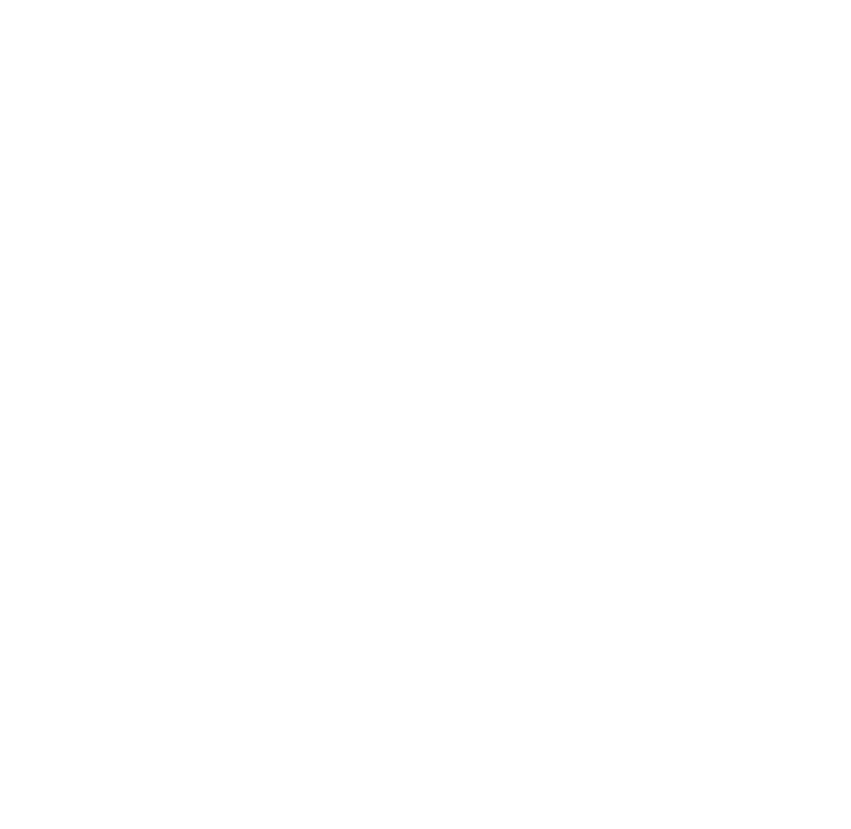

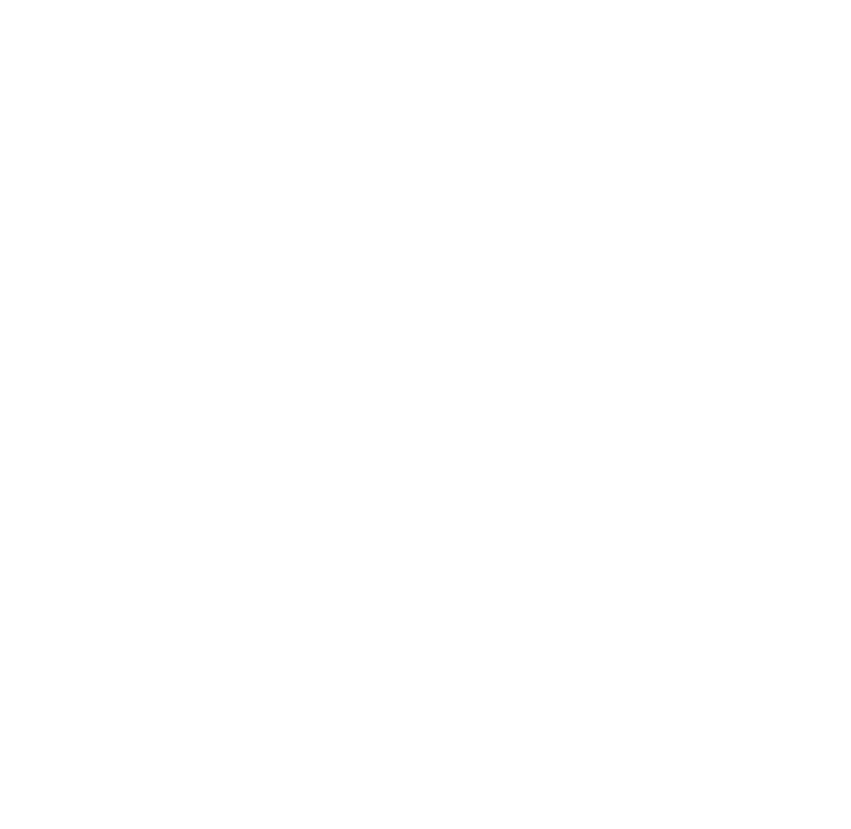

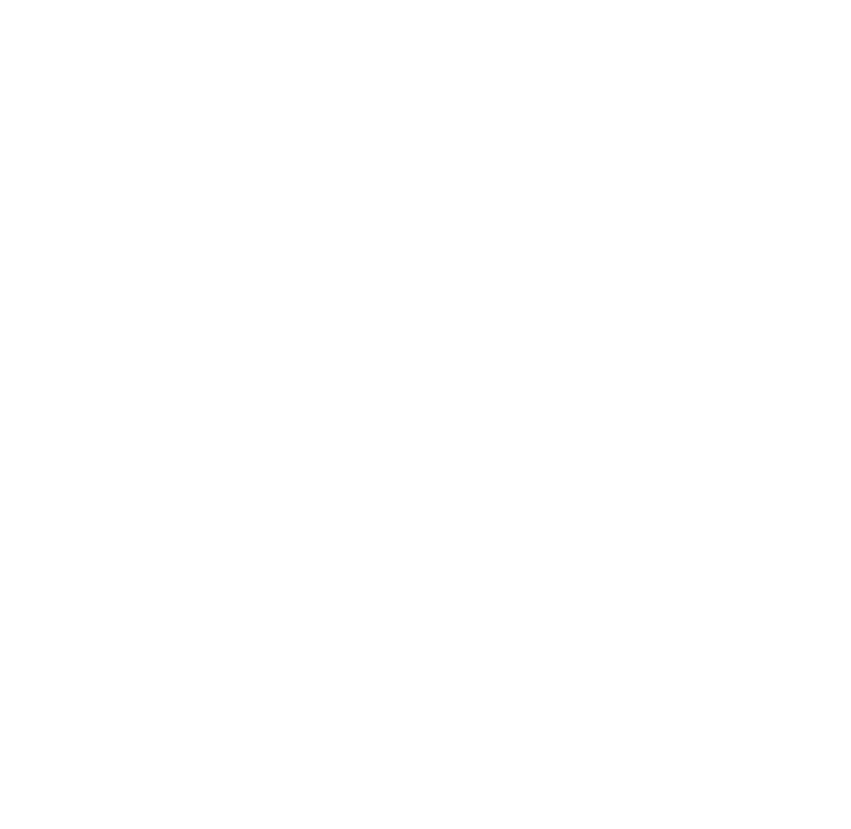

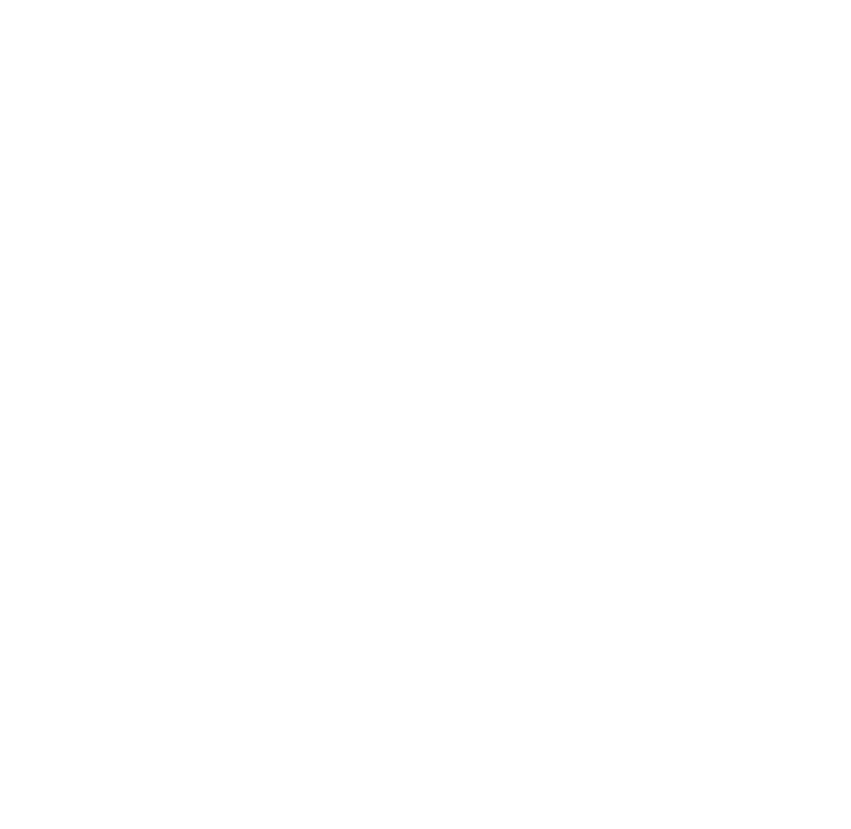

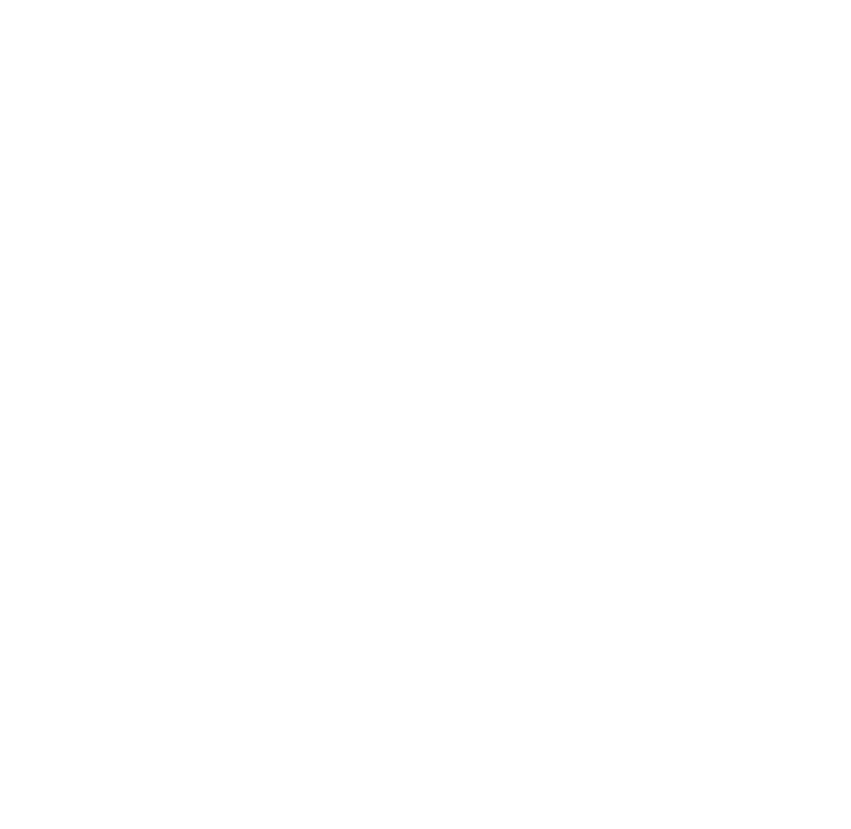

...

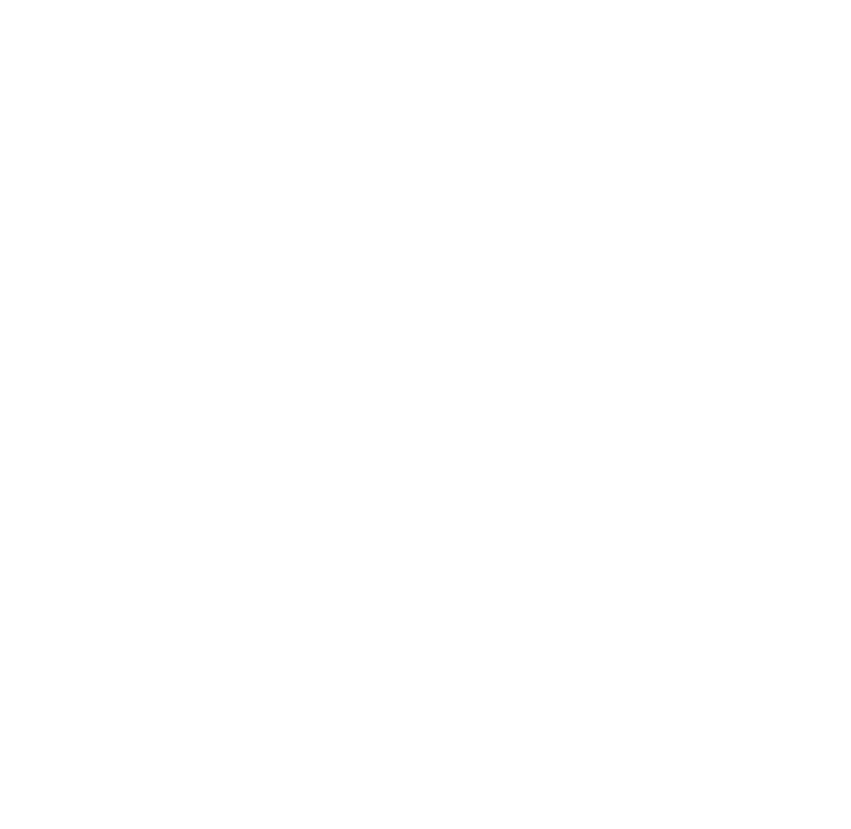

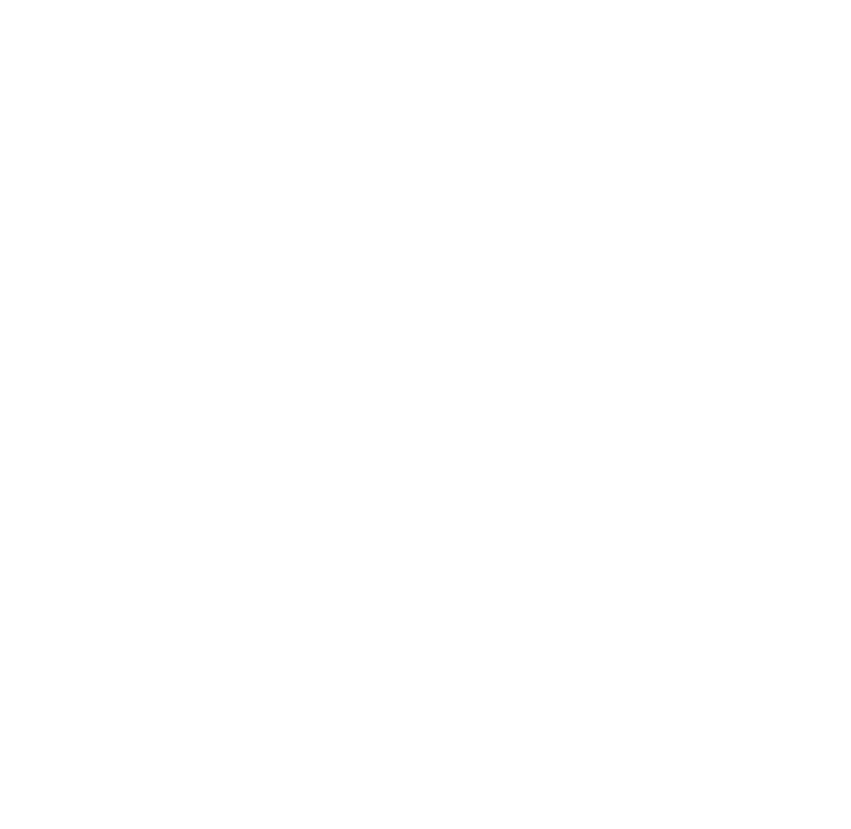

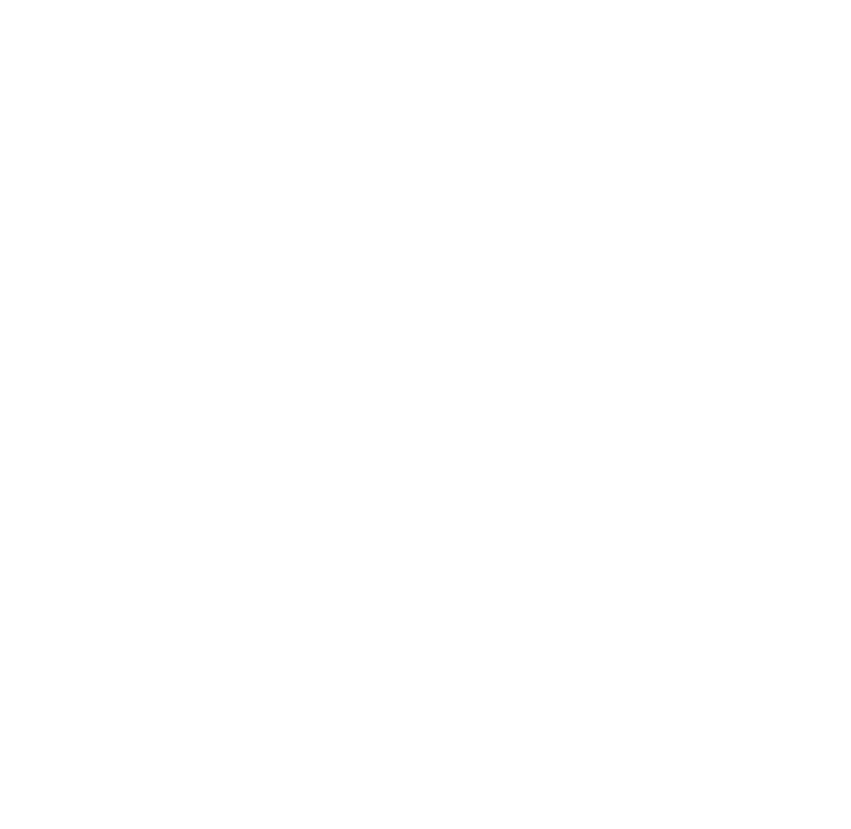

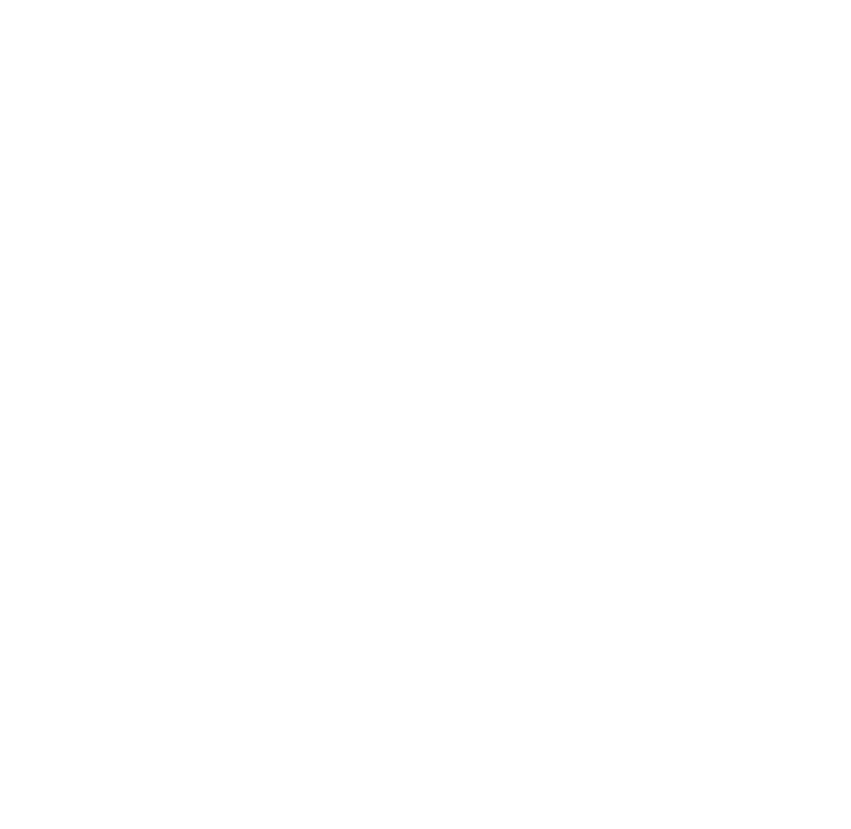

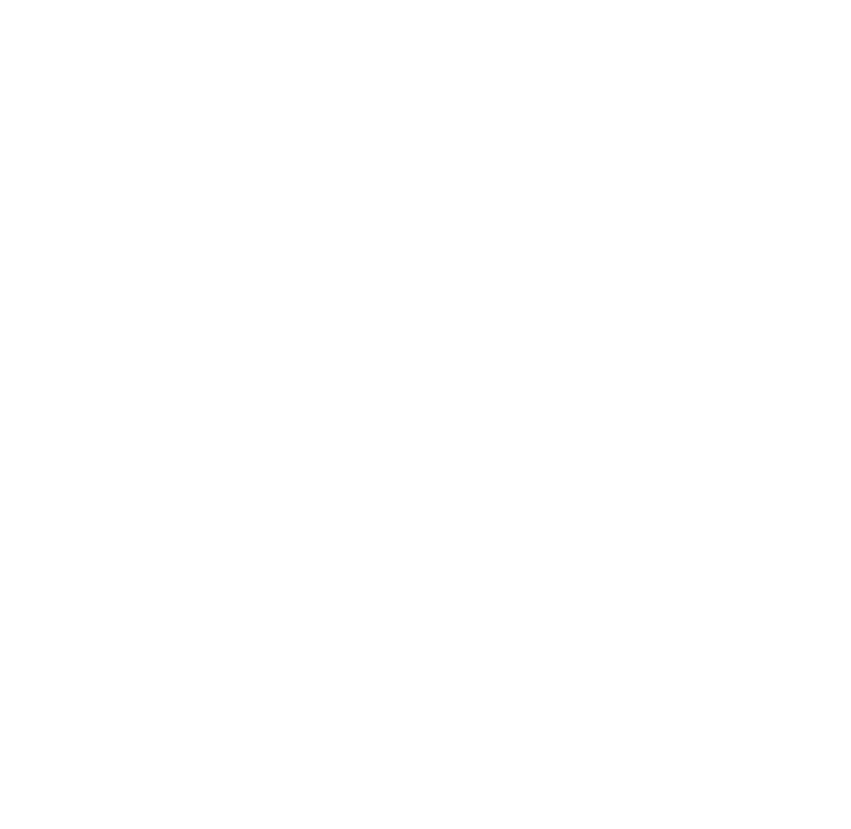

In [67]:
cap= cv2.VideoCapture(WEBCAM)

framenumber = 1
t1 = datetime.datetime.now() # Current datetime

print('Processing the video input: ', WEBCAM, 'for every', sampling_frames, 'frames\n')

while(cap.isOpened()):
    ret, frame = cap.read()
        
    if ret == False:
        break

    if framenumber%sampling_frames == 0: # sampling frames
        
        # Frontier definition
        lanes_left = (0, x_lanes_frontier)
        lanes_down = (x_lanes_frontier, w)
        
        # Printing informations
        currentdate = datetime.datetime.now()
        
        if len(str(framenumber)) == 1:
            framenumberstr = '000000' + str(framenumber)
        if len(str(framenumber)) == 2:
            framenumberstr = '00000' + str(framenumber)
        if len(str(framenumber)) == 3:
            framenumberstr = '0000' + str(framenumber)
        if len(str(framenumber)) == 4:
            framenumberstr = '000' + str(framenumber)
        if len(str(framenumber)) == 5:
            framenumberstr = '00' + str(framenumber)
        if len(str(framenumber)) == 6:
            framenumberstr = '0' + str(framenumber)
        
        print(currentdate, "Processing frame =", framenumberstr, '\n')
            
        # Saving frame
        cv2.imwrite('results/captures/frame_' + framenumberstr + '.jpg', frame) #Saving frame into image
        
        # Calling the yolo model
        img, preds = yolo.detectObjectsFromImage(input_image = frame, # Calling the model
                                         custom_objects = None, 
                                         input_type = "array",
                                         output_type = "array",
                                         minimum_percentage_probability = minpctprob,
                                         display_percentage_probability = True,
                                         display_object_name = True)
        
        # variables init
        counter1 = 1
        nb_cars = nb_trucks = nb_motos = nb_persons = nb_bus = nb_vehicles = 0
        l_nb_cars = l_nb_trucks = l_nb_motos = l_nb_persons = l_nb_bus = l_nb_vehicles = 0
        r_nb_cars = r_nb_trucks = r_nb_motos = r_nb_persons = r_nb_bus = r_nb_vehicles = 0
        
        # Parsing predictions
        for key in preds:
            print(counter1, '\t', str.upper(key['name']), ' ', round(key['percentage_probability']/100, 5), 
                  ' Bounding Box:', key['box_points'])
            
            if key['name'] == 'car':
                nb_cars += 1
            if key['name'] == 'truck':
                nb_trucks += 1
            if key['name'] == 'motorcycle':
                nb_motos += 1
            if key['name'] == 'person':
                nb_persons += 1
            if key['name'] == 'bus':
                nb_bus += 1
            
            roi = key['box_points']
            nb_vehicles = nb_cars + nb_trucks + nb_motos + nb_bus
            counter1 += 1
            
            # Center coordinates of ROIs
            x_center_roi = (roi[0] + roi[2]) / 2
            y_center_roi = (roi[1] + roi[3]) / 2
            
            if x_center_roi < x_lanes_frontier: # Counting vehicles from the left lanes
                    
                if key['name'] == 'car':
                    l_nb_cars += 1
                if key['name'] == 'truck':
                    l_nb_trucks += 1
                if key['name'] == 'motorcycle':
                    l_nb_motos += 1
                if key['name'] == 'person':
                    l_nb_persons += 1
                if key['name'] == 'bus':
                    l_nb_bus += 1
                l_nb_vehicles = l_nb_cars + l_nb_trucks + l_nb_motos + l_nb_bus
            
            if x_center_roi >= x_lanes_frontier: # Counting vehicles from the right lanes
                    
                if key['name'] == 'car':
                    r_nb_cars += 1
                if key['name'] == 'truck':
                    r_nb_trucks += 1
                if key['name'] == 'motorcycle':
                    r_nb_motos += 1
                if key['name'] == 'person':
                    r_nb_persons += 1
                if key['name'] == 'bus':
                    r_nb_bus += 1
                r_nb_vehicles = r_nb_cars + r_nb_trucks + r_nb_motos + r_nb_bus
        
        counter1 +=1
        
        # Traffic class
        
        if l_nb_vehicles < low_limit:
            traffic_left = "Low traffic"
            colorfont_traffic_l = (0, 100, 0)
        
        if l_nb_vehicles >= high_limit:
            traffic_left = "Heavy traffic"
            colorfont_traffic_l = (0, 0, 255)
        
        if l_nb_vehicles >= low_limit and l_nb_vehicles < high_limit:
            traffic_left = "Moderate traffic"
            colorfont_traffic_l = (0, 127, 255)
            
        if r_nb_vehicles < low_limit:
            traffic_right = "Low traffic"
            colorfont_traffic_r = (0, 100, 0)
        
        if r_nb_vehicles >= high_limit:
            traffic_right = "Heavy traffic"
            colorfont_traffic_r = (0, 0, 255)
        
        if r_nb_vehicles >= low_limit and l_nb_vehicles < high_limit:
            traffic_right = "Moderate traffic"
            colorfont_traffic_r = (0, 127, 255)

        # Printing informations
        print("\nStatistics:")
        print("Number of vehicles =", nb_vehicles)
        print("Including cars =", nb_cars)
        print("Including trucks =", nb_trucks)
        print("Including buses =", nb_bus)
        print("Including motorcycles =", nb_motos)
        print("Numbers of detected persons =", nb_persons)
        
        print("\nLeft Lanes Statistics:")
        print("Number of vehicles =", l_nb_vehicles)
        print("Traffic state:", traffic_left)
        print("Including cars =", l_nb_cars)
        print("Including trucks =", l_nb_trucks)
        print("Including buses =", l_nb_bus)
        print("Including motorcycles =", l_nb_motos)
        print("Numbers of detected persons =", l_nb_persons)
        
        print("\nRight Lanes Statistics:")
        print("Number of vehicles =", r_nb_vehicles)
        print("Traffic state:", traffic_right)
        print("Including cars =", r_nb_cars)
        print("Including trucks =", r_nb_trucks)
        print("Including buses =", r_nb_bus)
        print("Including motorcycles =", r_nb_motos)
        print("Numbers of detected persons =", r_nb_persons)
        
        # Logging to Azure ML experiments
        now = time.strftime('%d/%m/%Y %H:%M:%S')
        run.log("date", now)
        run.log("frame", framenumberstr)
        
        run.log("number_vehicles", nb_vehicles)
        run.log("number_vehicles_left", l_nb_vehicles)
        run.log("number_vehicles_right", r_nb_vehicles)
        run.log("traffic_state_right", traffic_right)
        run.log("traffic_state_left", traffic_left)

        run.log("numbers_cars_left", l_nb_cars)
        run.log("numbers_trucks_left", l_nb_trucks)
        run.log("numbers_bus_left", l_nb_bus)
        run.log("numbers_motorcycles_left",l_nb_motos)
        run.log("numbers_persons_left", l_nb_persons)
        
        run.log("numbers_cars_right", r_nb_cars)
        run.log("numbers_trucks_right", r_nb_trucks)
        run.log("numbers_bus_right", r_nb_bus)
        run.log("numbers_motorcycles_right", r_nb_motos)
        run.log("numbers_persons_right", r_nb_persons)
                
        plt.figure(figsize=(15,15)) 
        plt.axis('off')
        
        # Color definitions
        color_lime = (0, 255, 0)
        color_cyan = (255, 255, 0)
        color_red = (0, 0, 255)
        color_blue = (255, 0, 0)
        
        # Plots informations
        thickness1 = 2
        thickness2 = 1
        fontsize1 = 1
        fontsize2 = 0.8
        
        # Vertical reference line
        cv2.line(img, (x_lanes_frontier, 0), (x_lanes_frontier, h), color_lime, 2) # Frontier line
        
        # Creation of text informations
        msgdate = str(currentdate)
        msgframe = "Frame : " + framenumberstr
        msgcamera = "Camera 1"
        totalvehicles = "Total number of vehicules = " + str(nb_vehicles)
        totalvehiclesl = "Total number of vehicules in Left = " + str(l_nb_vehicles)
        totalvehiclesr = "Total number of vehicules in Right = " + str(r_nb_vehicles)
        
        totalcars = l_nb_cars + r_nb_cars
        totaltrucks = l_nb_trucks + r_nb_trucks
        totalbuses = l_nb_bus + r_nb_bus
        totalmotos = l_nb_motos + r_nb_motos
        totalpersons = l_nb_persons + r_nb_persons
        
        run.log("totalcars", totalcars)
        run.log("totaltrucks", totaltrucks)
        run.log("totalbuses", totalbuses)
        run.log("totalmotos", totalmotos)
        run.log("totalpersons", totalpersons)
        
        totalcarsl = "Cars in Left = " + str(l_nb_cars)
        totaltrucksl = "Trucks in Left = " + str(l_nb_trucks)
        totalbusesl = "Buses in Left = " + str(l_nb_bus)
        totalmotosl = "Motorcycles in Left = " + str(l_nb_motos)
        totalpersonsl = "Persons in Left = " + str(l_nb_persons)
        
        totalcarsr = "Cars in Right = " + str(r_nb_cars)
        totaltrucksr = "Trucks in Right = " + str(r_nb_trucks)
        totalbusesr = "Buses in Right = " + str(r_nb_bus)
        totalmotosr = "Motorcycles in Right = " + str(r_nb_motos)
        totalpersonsr = "Persons in Right = " + str(r_nb_persons)

        coordmsg1 = x_lanes_frontier + 50
        coordmsg2 = x_lanes_frontier + 200
        coordmsg3 = x_lanes_frontier + 300
        
        msgstrafficl = "Traffic state: " + str(traffic_left)
        msgstrafficr = "Traffic state: " + str(traffic_right)
        
        # OpenCV text displays
        cv2.putText(img, msgdate, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)
        cv2.putText(img, msgcamera, (coordmsg1, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)       
        cv2.putText(img, msgframe, (coordmsg2 + 130, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)
        
        cv2.putText(img, totalvehicles, (10, 80), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_blue, thickness1)
        cv2.putText(img, totalvehiclesl, (10, 130), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_red, thickness1)
        cv2.putText(img, totalvehiclesr, (coordmsg1, 130), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_red, thickness1)
        
        cv2.putText(img, msgstrafficl, (10, 160), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, colorfont_traffic_l, thickness1)
        cv2.putText(img, msgstrafficr, (coordmsg1, 160), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, colorfont_traffic_r, 
                    thickness1)
        
        cv2.putText(img, totalcarsl, (10, 220), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totaltrucksl, (10, 250), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalbusesl, (10, 280), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalmotosl, (10, 310), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalpersonsl, (10, 340), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        
        cv2.putText(img, totalcarsr, (coordmsg3, 220), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totaltrucksr, (coordmsg3, 250), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalbusesr, (coordmsg3, 280), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalmotosr, (coordmsg3, 310), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalpersonsr, (coordmsg3, 340), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        
        # Saving processed frame to a jpg file format
        jpgimagefile = 'results/processed_frame_' + framenumberstr + '.jpg'
        cv2.imwrite(jpgimagefile, img) # Saving image with results
        run.log_image(name = 'processedimage', path = jpgimagefile)
        
        print('\n/// Processing next frame ... ///', '\n')
    
    framenumber += 1

t2 = datetime.datetime.now()
print(t2, 'Done in:', t2 - t1)
cap.release()

### Azure ML experiment

In [68]:
experiment

Name,Workspace,Report Page,Docs Page
Vehicles_Detection,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


### Retrieving logged metrics

In [70]:
videoresults = run.get_metrics() # Get Metrics from the Azure ML experiment
videoresults_df = pd.DataFrame(videoresults) # Convert to a pandas df

In [71]:
videoresults_df.shape

(600, 23)

In [72]:
videoresults_df.dtypes

date                         object
frame                        object
number_vehicles               int64
number_vehicles_left          int64
number_vehicles_right         int64
traffic_state_right          object
traffic_state_left           object
numbers_cars_left             int64
numbers_trucks_left           int64
numbers_bus_left              int64
numbers_motorcycles_left      int64
numbers_persons_left          int64
numbers_cars_right            int64
numbers_trucks_right          int64
numbers_bus_right             int64
numbers_motorcycles_right     int64
numbers_persons_right         int64
totalcars                     int64
totaltrucks                   int64
totalbuses                    int64
totalmotos                    int64
totalpersons                  int64
processedimage               object
dtype: object

In [73]:
videoresults_df.head(3)

,date,frame,number_vehicles,number_vehicles_left,number_vehicles_right,traffic_state_right,traffic_state_left,numbers_cars_left,numbers_trucks_left,numbers_bus_left,...,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons,processedimage
0,18/01/2022 10:03:23,0000025,13,9,4,Low traffic,Moderate traffic,8,1,0,...,1,0,0,0,11,2,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...
1,18/01/2022 10:03:28,0000050,13,7,6,Moderate traffic,Moderate traffic,5,2,0,...,1,0,0,0,10,3,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...
2,18/01/2022 10:03:33,0000075,13,9,4,Low traffic,Moderate traffic,8,1,0,...,0,0,0,0,12,1,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...


In [74]:
videoresults_df.tail(3)

,date,frame,number_vehicles,number_vehicles_left,number_vehicles_right,traffic_state_right,traffic_state_left,numbers_cars_left,numbers_trucks_left,numbers_bus_left,...,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons,processedimage
597,18/01/2022 10:55:17,0014950,19,11,8,Moderate traffic,Heavy traffic,10,1,0,...,1,0,0,0,17,2,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...
598,18/01/2022 10:55:22,0014975,17,10,7,Moderate traffic,Heavy traffic,9,1,0,...,0,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...
599,18/01/2022 10:55:27,0015000,14,8,6,Moderate traffic,Moderate traffic,7,1,0,...,0,0,0,0,13,1,0,0,0,aml://artifactId/ExperimentRun/dcid.99e814e7-1...


In [75]:
videoresults_df.describe()

,number_vehicles,number_vehicles_left,number_vehicles_right,numbers_cars_left,numbers_trucks_left,numbers_bus_left,numbers_motorcycles_left,numbers_persons_left,numbers_cars_right,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons
count,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000
mean,15.811667,9.881667,5.930000,8.973333,0.805000,0.090000,0.013333,0.008333,5.515000,0.338333,0.071667,0.005000,0.001667,14.488333,1.143333,0.161667,0.018333,0.010000
std,3.148977,2.441502,2.247261,2.529813,0.833546,0.303403,0.114793,0.090982,2.162769,0.592550,0.270776,0.070593,0.040825,3.133085,1.012174,0.407194,0.134266,0.099582
min,8.000000,3.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,8.000000,4.000000,7.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000
50%,16.000000,10.000000,6.000000,9.000000,1.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,15.000000,1.000000,0.000000,0.000000,0.000000
75%,18.000000,11.000000,7.000000,10.000000,1.000000,0.000000,0.000000,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,16.000000,2.000000,0.000000,0.000000,0.000000
max,25.000000,20.000000,12.000000,19.000000,4.000000,2.000000,1.000000,1.000000,11.000000,4.000000,2.000000,1.000000,1.000000,24.000000,5.000000,2.000000,1.000000,1.000000


## Statistics

In [76]:
videoresults_df['traffic_state_right'].value_counts()

Moderate traffic    316
Low traffic         248
Heavy traffic        36
Name: traffic_state_right, dtype: int64

In [77]:
videoresults_df['traffic_state_right'].value_counts(normalize=True)

Moderate traffic    0.526667
Low traffic         0.413333
Heavy traffic       0.060000
Name: traffic_state_right, dtype: float64

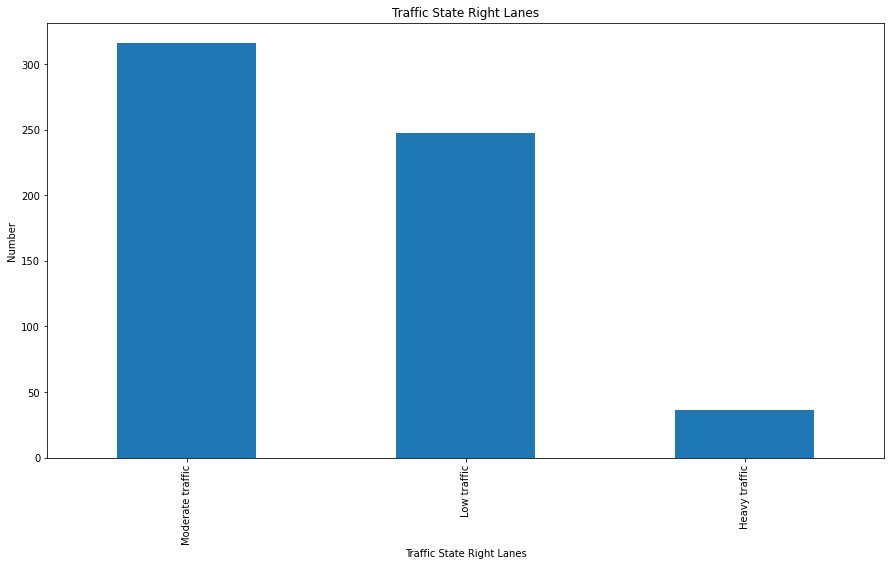

In [78]:
%matplotlib inline
import matplotlib.pyplot as plt

ax = videoresults_df['traffic_state_right'].value_counts().plot(kind='bar',
                                    figsize=(15,8),
                                    title="Traffic State Right Lanes")

ax.set_xlabel("Traffic State Right Lanes")
ax.set_ylabel("Number")
plt.savefig("output/trafficstateright_plot.png", dpi=300)

In [79]:
videoresults_df['traffic_state_left'].value_counts()

Heavy traffic       312
Moderate traffic    285
Low traffic           3
Name: traffic_state_left, dtype: int64

In [80]:
videoresults_df['traffic_state_left'].value_counts(normalize=True)

Heavy traffic       0.520
Moderate traffic    0.475
Low traffic         0.005
Name: traffic_state_left, dtype: float64

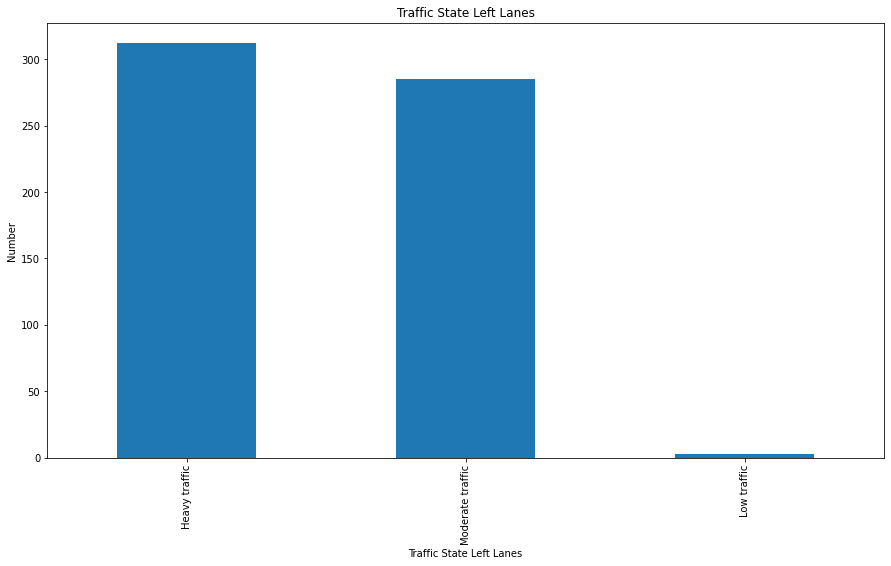

In [81]:
%matplotlib inline
import matplotlib.pyplot as plt

ax = videoresults_df['traffic_state_left'].value_counts().plot(kind='bar',
                                    figsize=(15,8),
                                    title="Traffic State Left Lanes")
ax.set_xlabel("Traffic State Left Lanes")
ax.set_ylabel("Number")
plt.savefig("output/trafficstateleft_plot.png", dpi=300)

### Vehicles

In [82]:
print("--- Minimum ---")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].min())
print("\n--- Maximum ---")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].max())
print("\n--- Mean ---")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].mean())
print("\n--- Sum ---")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].sum())

--- Minimum ---
number_vehicles          8
number_vehicles_left     3
number_vehicles_right    0
dtype: int64

--- Maximum ---
number_vehicles          25
number_vehicles_left     20
number_vehicles_right    12
dtype: int64

--- Mean ---
number_vehicles          15.811667
number_vehicles_left      9.881667
number_vehicles_right     5.930000
dtype: float64

--- Sum ---
number_vehicles          9487
number_vehicles_left     5929
number_vehicles_right    3558
dtype: int64


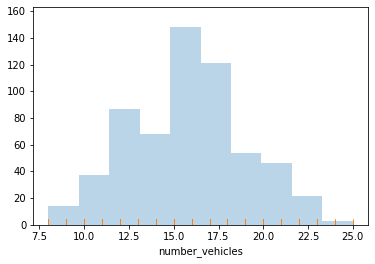

In [83]:
plt.hist(videoresults_df.number_vehicles, alpha=.3)
sns.rugplot(videoresults_df.number_vehicles)
plt.show()

<AxesSubplot:xlabel='number_vehicles', ylabel='Density'>

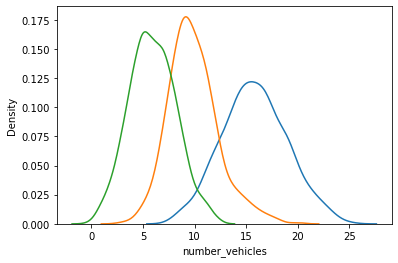

In [84]:
sns.kdeplot(videoresults_df.number_vehicles)
sns.kdeplot(videoresults_df.number_vehicles_left)
sns.kdeplot(videoresults_df.number_vehicles_right)

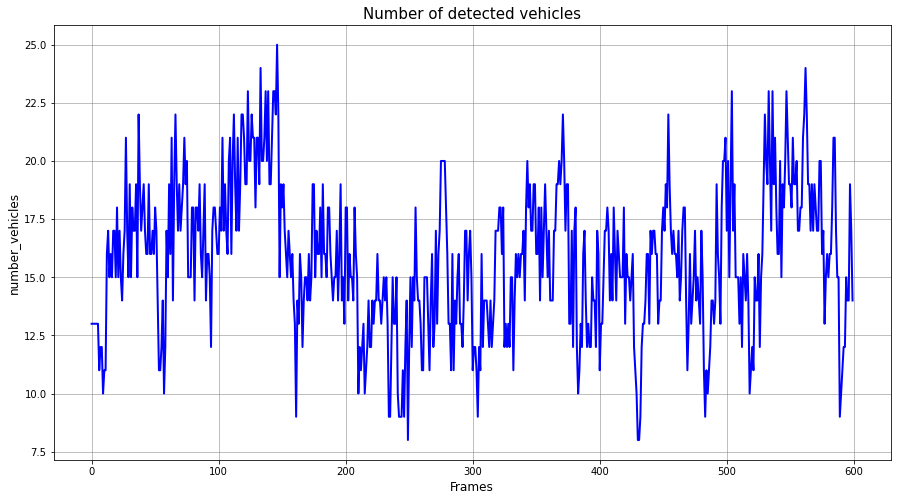

In [85]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['number_vehicles'], label='Number of vehicles', color='blue', linewidth = 2)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_vehicles', fontsize = 12)
plt.title('Number of detected vehicles', fontsize = 15)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.savefig("output/vehicules_plot.png", dpi=300)
plt.show()

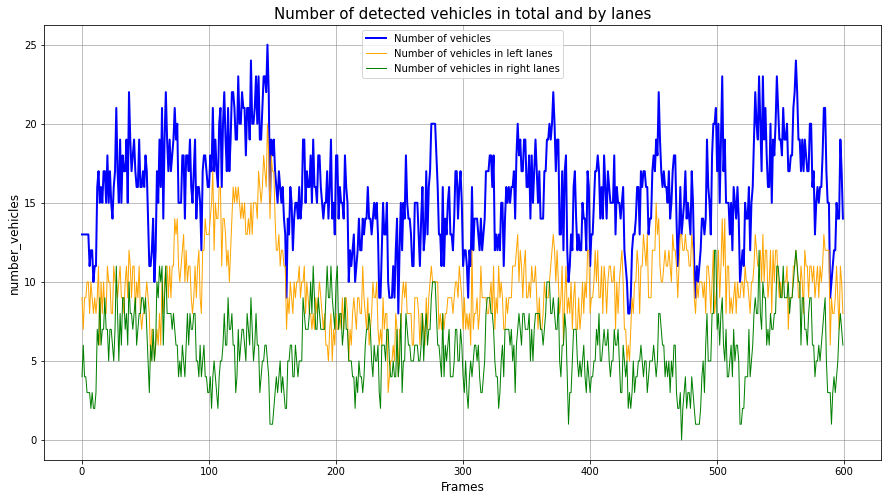

In [86]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['number_vehicles'], label='Number of vehicles', color='blue', linewidth = 2)
plt.plot(videoresults_df['number_vehicles_left'], label='Number of vehicles in left lanes', color='orange', linewidth = 1)
plt.plot(videoresults_df['number_vehicles_right'], label='Number of vehicles in right lanes', color='green', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_vehicles', fontsize = 12)
plt.title('Number of detected vehicles in total and by lanes', fontsize = 15)

plt.savefig("output/vehicules_plot2.png", dpi=300)
plt.show()

### Cars only

In [87]:
print("---Minimum ---")
print(videoresults_df[['totalcars', 'numbers_cars_left', 'numbers_cars_right']].min())
print("\n--- Maximum ---")
print(videoresults_df[['totalcars','numbers_cars_left', 'numbers_cars_right']].max())
print("\n--- Mean ---")
print(videoresults_df[['totalcars','numbers_cars_left', 'numbers_cars_right']].mean())
print("\n--- Sum ---")
print(videoresults_df[['totalcars','numbers_cars_left', 'numbers_cars_right']].sum())

---Minimum ---
totalcars             6
numbers_cars_left     2
numbers_cars_right    0
dtype: int64

--- Maximum ---
totalcars             24
numbers_cars_left     19
numbers_cars_right    11
dtype: int64

--- Mean ---
totalcars             14.488333
numbers_cars_left      8.973333
numbers_cars_right     5.515000
dtype: float64

--- Sum ---
totalcars             8693
numbers_cars_left     5384
numbers_cars_right    3309
dtype: int64


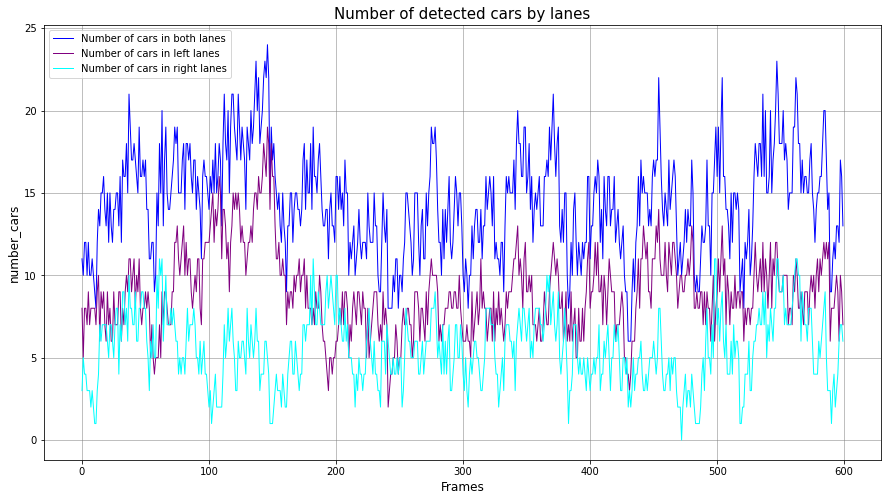

In [88]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totalcars'], label='Number of cars in both lanes', color='blue', linewidth = 1)
plt.plot(videoresults_df['numbers_cars_left'], label='Number of cars in left lanes', color='purple', linewidth = 1)
plt.plot(videoresults_df['numbers_cars_right'], label='Number of cars in right lanes', color='cyan', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_cars', fontsize = 12)
plt.title('Number of detected cars by lanes', fontsize = 15)

plt.savefig("output/cars_plot.png", dpi=300)
plt.show()

### Trucks only

In [89]:
print("--- Minimum ---")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].min())
print("\n--- Maximum ---")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].max())
print("\n--- Mean ---")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].mean())
print("\n--- Sum ---")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].sum())

--- Minimum ---
totaltrucks             0
numbers_trucks_left     0
numbers_trucks_right    0
dtype: int64

--- Maximum ---
totaltrucks             5
numbers_trucks_left     4
numbers_trucks_right    4
dtype: int64

--- Mean ---
totaltrucks             1.143333
numbers_trucks_left     0.805000
numbers_trucks_right    0.338333
dtype: float64

--- Sum ---
totaltrucks             686
numbers_trucks_left     483
numbers_trucks_right    203
dtype: int64


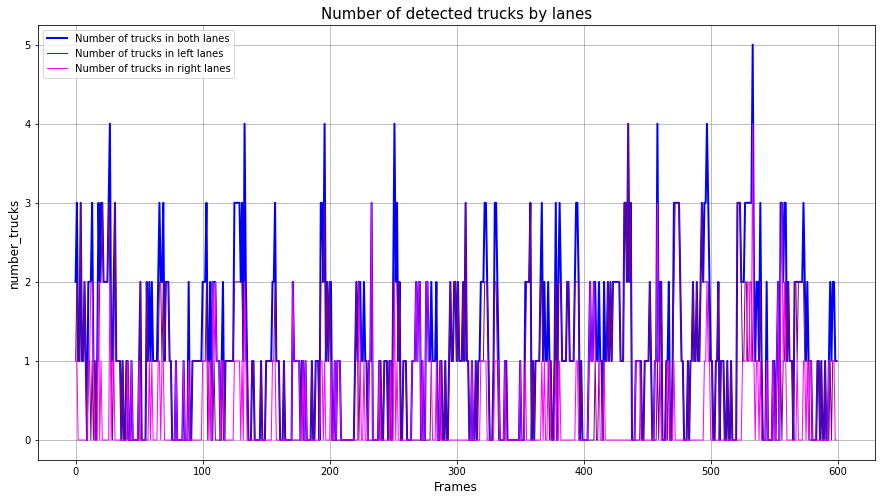

In [90]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totaltrucks'], label='Number of trucks in both lanes', color='blue', linewidth = 2)
plt.plot(videoresults_df['numbers_trucks_left'], label='Number of trucks in left lanes', color='purple', linewidth = 1)
plt.plot(videoresults_df['numbers_trucks_right'], label='Number of trucks in right lanes', color='magenta', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_trucks', fontsize = 12)
plt.title('Number of detected trucks by lanes', fontsize = 15)

plt.savefig("output/trucks_plot.png", dpi=300)
plt.show()

### Persons only

In [91]:
print("--- Minimum ---")
print(videoresults_df[['totalpersons', 'numbers_persons_left', 'numbers_persons_right']].min())
print("\n--- Maximum ---")
print(videoresults_df[['totalpersons','numbers_persons_left', 'numbers_persons_right']].max())
print("\n--- Mean ---")
print(videoresults_df[['totalpersons','numbers_persons_left', 'numbers_persons_right']].mean())
print("\n--- Sum ---")
print(videoresults_df[['totalpersons','numbers_persons_left', 'numbers_persons_right']].sum())

--- Minimum ---
totalpersons             0
numbers_persons_left     0
numbers_persons_right    0
dtype: int64

--- Maximum ---
totalpersons             1
numbers_persons_left     1
numbers_persons_right    1
dtype: int64

--- Mean ---
totalpersons             0.010000
numbers_persons_left     0.008333
numbers_persons_right    0.001667
dtype: float64

--- Sum ---
totalpersons             6
numbers_persons_left     5
numbers_persons_right    1
dtype: int64


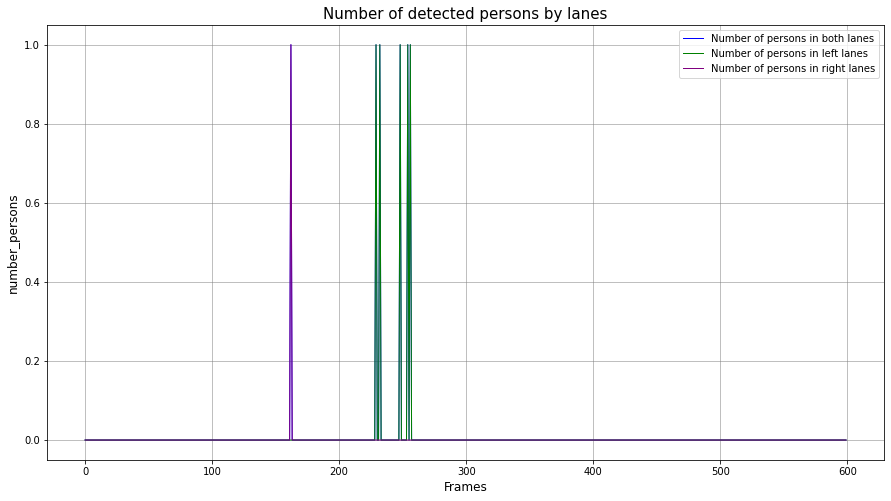

In [92]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totalpersons'], label='Number of persons in both lanes', color='blue', linewidth = 1)
plt.plot(videoresults_df['numbers_persons_left'], label='Number of persons in left lanes', color='green', linewidth = 1)
plt.plot(videoresults_df['numbers_persons_right'], label='Number of persons in right lanes', color='purple', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_persons', fontsize = 12)
plt.title('Number of detected persons by lanes', fontsize = 15)

plt.savefig("output/persons_plot.png", dpi=300)
plt.show()

### Exporting metrics

In [93]:
EXCELFILE = 'output/videometrics.xls'
CSVFILE = 'output/videometrics.csv'

In [94]:
videoresults_df.to_excel(EXCELFILE, index = False, sheet_name = "predictions") # Excel export
videoresults_df.to_csv(CSVFILE, index = False) # CSV export

In [95]:
!ls output/*.xls -lh

-rwxrwxrwx 1 root root 155K Jan 18 11:02 output/videometrics.xls


In [96]:
!ls output/*.csv -lh

-rwxrwxrwx 1 root root 122K Jan 18 11:02 output/videometrics.csv


In [97]:
from IPython.display import FileLink
xls_link = FileLink(path = EXCELFILE)
print("Link to download the Excel file:")
xls_link

Link to download the Excel file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/output/videometrics.xls

In [98]:
csv_link = FileLink(path = CSVFILE)
print("Link to download the CSV file:")
csv_link

Link to download the CSV file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/output/videometrics.csv

### Saving the processed frames into a new video

In [99]:
results_path = 'results'
video_output = 'processed_video.avi'
output_path = 'output'
video_outputfilename = output_path + '/' + video_output

In [100]:
t1 = datetime.datetime.now()

print(t1, "Saving the frames into a video:", video_outputfilename, '\n')

images = [img for img in os.listdir(results_path) if img.endswith(".jpg")] # Taking the jpg files
frame = cv2.imread(os.path.join(results_path, images[0]))
height, width, layers = frame.shape
video = cv2.VideoWriter(video_outputfilename, 0, 1, (width, height))

for image in images:
    video.write(cv2.imread(os.path.join(results_path, image))) # Take the images and generate the video file

video.release()
t2 = datetime.datetime.now()
print('Done in', t2 - t1)

2022-01-18 11:02:45.604616 Saving the frames into a video: output/processed_video.avi 

Done in 0:01:09.921435


In [101]:
from IPython.display import FileLink
video_link = FileLink(path = video_outputfilename)
print("Link to download the video file:")
video_link

Link to download the video file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/output/processed_video.avi

## Filtering the results

In [103]:
videoresults_df.columns

Index(['date', 'frame', 'number_vehicles', 'number_vehicles_left',
       'number_vehicles_right', 'traffic_state_right', 'traffic_state_left',
       'numbers_cars_left', 'numbers_trucks_left', 'numbers_bus_left',
       'numbers_motorcycles_left', 'numbers_persons_left',
       'numbers_cars_right', 'numbers_trucks_right', 'numbers_bus_right',
       'numbers_motorcycles_right', 'numbers_persons_right', 'totalcars',
       'totaltrucks', 'totalbuses', 'totalmotos', 'totalpersons',
       'processedimage'],
      dtype='object')

#### Creating the selection

In [142]:
select_df = videoresults_df[videoresults_df['totalmotos'] >= 1] # Selection
select_df = select_df['frame'] # Only the frame
print(select_df)
print()
print(len(select_df))

162    0004075
229    0005750
232    0005825
248    0006225
254    0006375
255    0006400
290    0007275
291    0007300
345    0008650
346    0008675
347    0008700
Name: frame, dtype: object

11


#### Displaying a random image from the selection

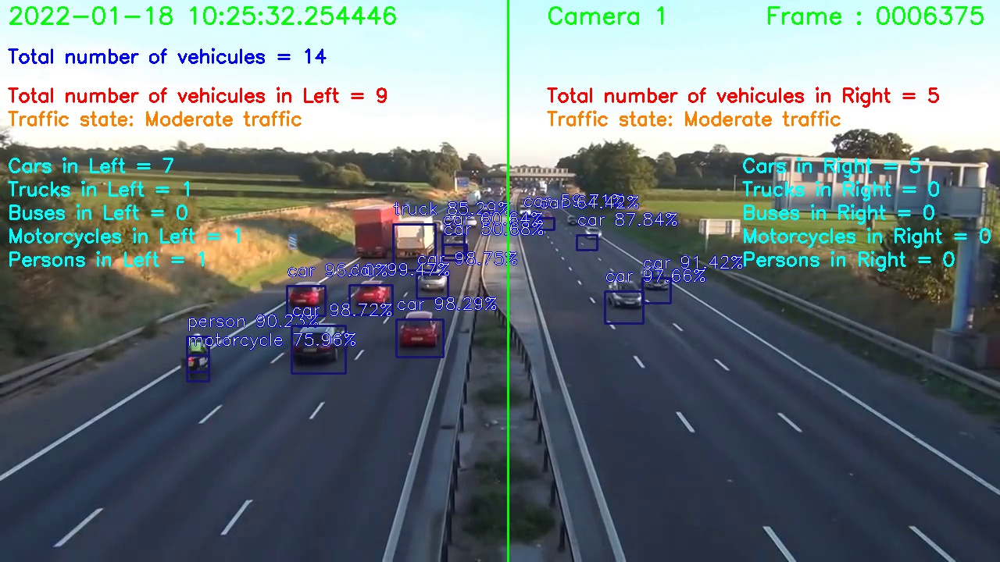

In [143]:
framenumber = select_df.iat[random.randint(0, len(select_df))] # Display a random value from the selection

from IPython.display import Image
myimage = 'results/processed_frame_' + str(framenumber) + '.jpg'
Image(filename=myimage) 